In [3]:
# libraries
import numpy as np
import pandas as pd
import random
import seaborn as sns
sns.set(style="ticks", color_codes=True)
from sklearn import neighbors
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

In [4]:
#Columns/Features
D = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']
L = 'quality'
C = 'color'
DL = D + [L]
DC = D + [C]
DLC = DL + [C]

#Loading Data set
wine_r = pd.read_csv("winequality-red.csv", sep=';')
#Loading Data set
wine_w = pd.read_csv("winequality-white.csv", sep=';')
wine_w= wine_w.copy()
wine_w[C]= np.zeros(wine_w.shape[0])
wine_r[C]= np.ones(wine_r.shape[0])
wine = pd.concat([wine_w,wine_r])

In [5]:
print(wine.shape)
wine[D].describe()
wine[D].head()

(6497, 13)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9


In [8]:
# classify color of wine with all features
X = wine[D].values
y = np.ravel(wine[[C]])
from sklearn.preprocessing import StandardScaler
X_znorm = wine.copy()
X_znorm[D] = pd.DataFrame(StandardScaler().fit_transform(X_znorm[D]))
X_znorm.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,-0.166089,-0.423183,0.284686,3.206929,-0.314975,0.815565,0.959976,2.102214,-1.359049,-0.546178,-1.418558,6,0.0
1,-0.706073,-0.240949,0.147046,-0.807837,-0.200790,-0.931107,0.287618,-0.232332,0.506915,-0.277351,-0.831615,6,0.0
2,0.682458,-0.362438,0.559966,0.306208,-0.172244,-0.029599,-0.331660,0.134525,0.258120,-0.613385,-0.328521,6,0.0
3,-0.011808,-0.666161,0.009406,0.642523,0.056126,0.928254,1.243074,0.301278,-0.177272,-0.882212,-0.496219,6,0.0
4,-0.011808,-0.666161,0.009406,0.642523,0.056126,0.928254,1.243074,0.301278,-0.177272,-0.882212,-0.496219,6,0.0


## Normalized Pairplots

### Label = Color

C:\Users\JAYAGN\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\JAYAGN\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


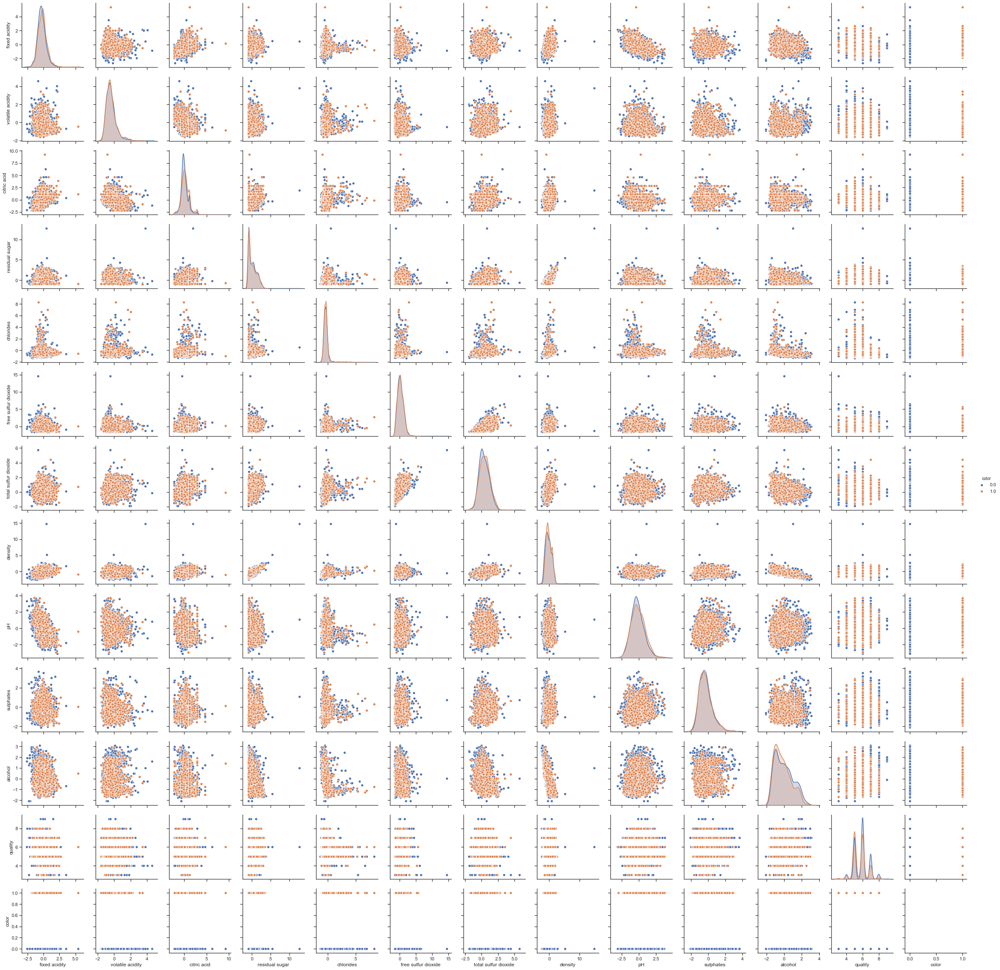

In [9]:
sns.pairplot(X_znorm,hue='color')


- For normalized features pairplot, it is hard to seperate labels.
- Hence, unnormalized features pairplot can be plotted to see the difference.

### Label = Quality

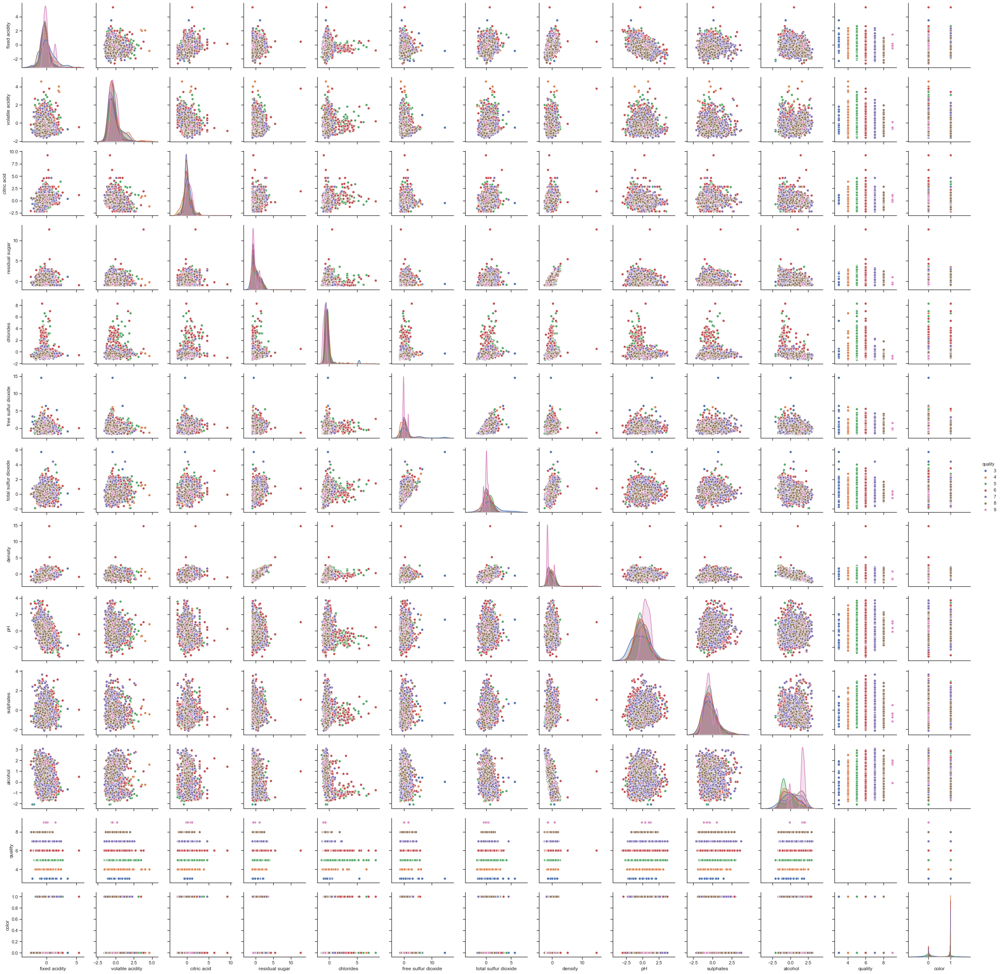

In [10]:
sns.pairplot(X_znorm,hue='quality')

- It is hard to interpret this pairplot as it is all messed up.
- Hence this graph seems to be of no use for labels seperations. 
- Unnormalized pairplot with quality label can be used to see the difference

## Unnormalized Pairplots

### Label = Color

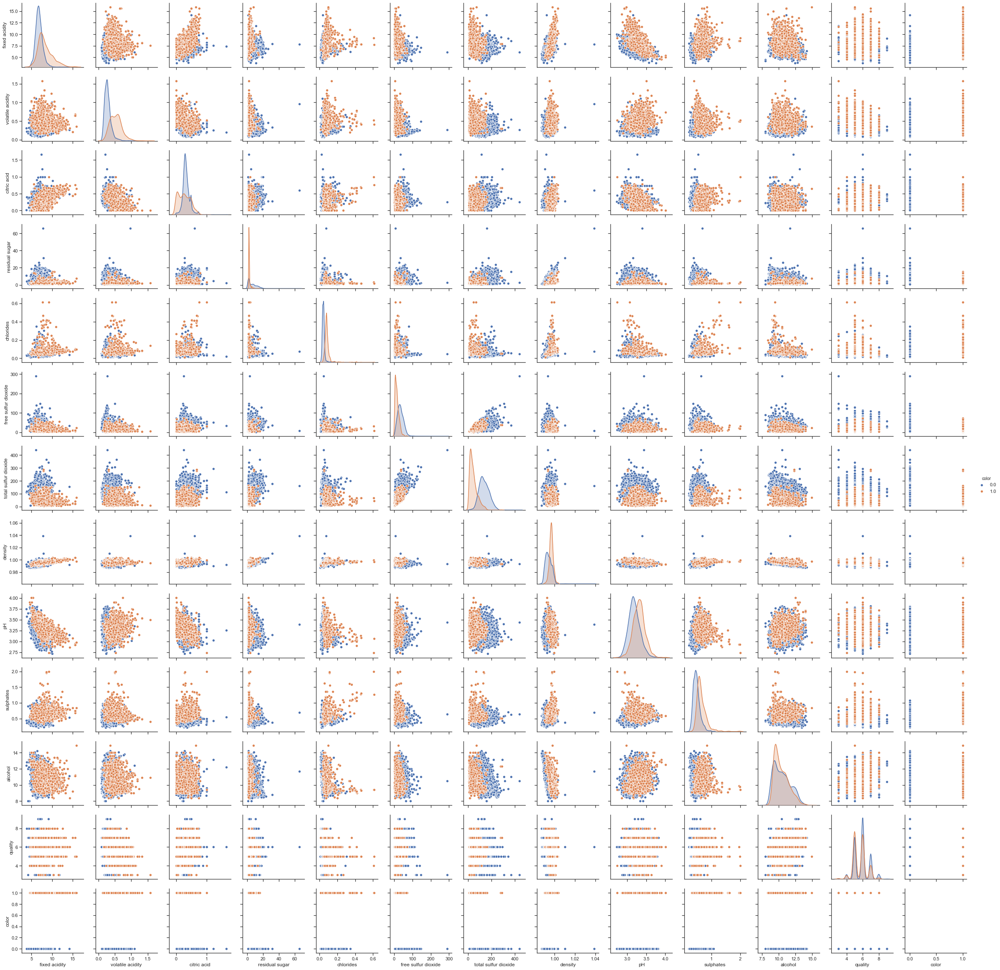

In [11]:
sns.pairplot(wine,hue='color')

- The pairplot is bit hard to interpret. But the two colours are clearly seperatable when 'Total Sulphar Dioxide' Feature is used.
- Else, for all 'Sulphates','citric acid' and for few other features, graph seems to be all messed up and hard to seperate the color labels.
- Unnormalized pairplot seems to better visually, as we can obeserve few feature 'Total Sulphar Dioxide','Residual sugar'and 'pH' that can seperate the labels upto certain limit.

### Label = Quality

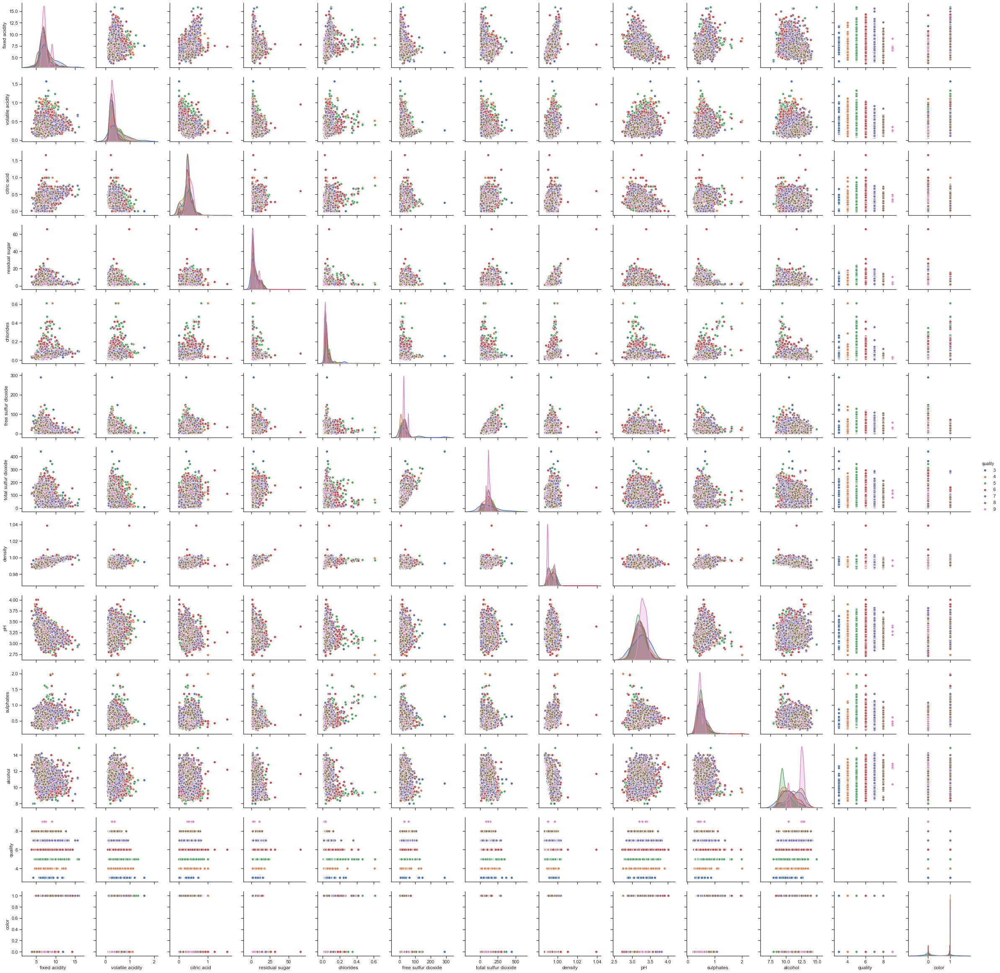

In [12]:
sns.pairplot(wine,hue='quality')

- For Unnormalized features pairplot with quality , there seems to be many outliers.
- The pairplot is visually better than normalized pairplot.but still can be used for separating labels.
- So, for quality as label, normalized and unnormalized both perform same and cannot be used to label seperation.

## Classification

In [331]:
X = wine[D]

y = wine[[L] + [C]]

In [332]:
#Train,Test split of unnormalized data.
ran = 42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = ran)

### Label = Colour and Unnormalized

In [85]:
#applying euclidean,manhattan,chebyshev,hamming,canberra and braycurtis weights.
#for value of k from 1 to 50

n_neighborslist = list(range(1,51))
metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']
# accarray = np.zeros((len(n_neighborslist),1))
accscore = []
acc = []

for k in n_neighborslist:
    neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k)
    neigh_color.fit(X_train, y_train)
    y_pred = neigh_color.predict(X_test)
    acc.append(accuracy_score(y_test, y_pred))
accscore.append(acc)

for m in metrics:
    acc = []
    for k in n_neighborslist:
        neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k,weights = 'distance',metric=m)
        neigh_color.fit(X_train, y_train)
        y_pred = neigh_color.predict(X_test)
        acc.append(accuracy_score(y_test, y_pred))
    accscore.append(acc)

In [86]:
accscore_df = pd.DataFrame(np.array(accscore).T,columns=['uniform','euclidean','manhattan','chebyshev','hamming',
                                                         'canberra','braycurtis'])
accscore_df['k'] = [k for k in range(1,51)]
print(accscore_df.shape)
accscore_df.head()

(50, 8)


,uniform,euclidean,manhattan,chebyshev,hamming,canberra,braycurtis,k
0,0.950000,0.950000,0.961538,0.945385,0.885385,0.991538,0.961538,1
1,0.939231,0.950000,0.961538,0.946154,0.913846,0.991538,0.961538,2
2,0.935385,0.949231,0.960000,0.945385,0.903846,0.990769,0.961538,3
3,0.935385,0.951538,0.960769,0.946154,0.923846,0.990000,0.960769,4
4,0.936154,0.950769,0.961538,0.946154,0.908462,0.993846,0.960769,5


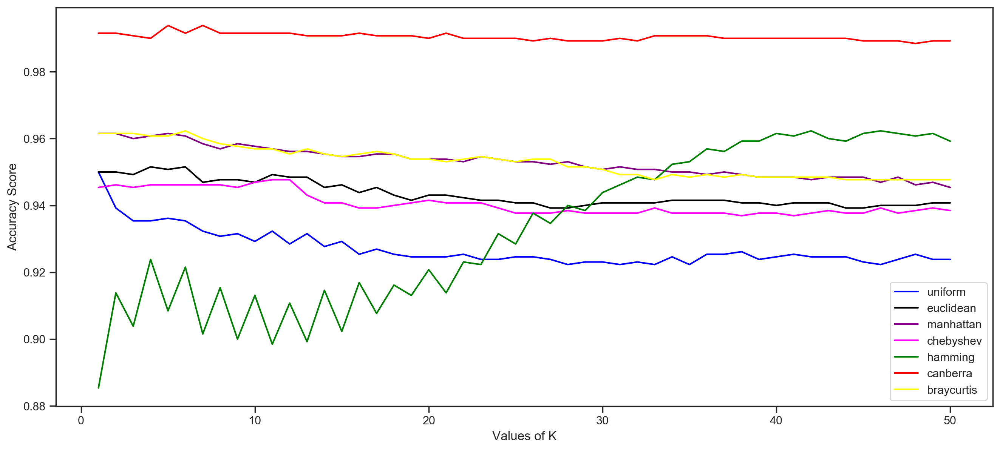

In [87]:
%matplotlib inline
plt.figure(figsize=(16,7),dpi=200)
plt.plot('k','uniform',data=accscore_df,color='blue')
plt.plot('k','euclidean',data=accscore_df,color='black')
plt.plot('k','manhattan',data=accscore_df,color='purple')
plt.plot('k','chebyshev',data=accscore_df,color='magenta')
plt.plot('k','hamming',data=accscore_df,color='green')
plt.plot('k','canberra',data=accscore_df,color='red')
plt.plot('k','braycurtis',data=accscore_df,color='yellow')
plt.xlabel('Values of K')
plt.ylabel('Accuracy Score')
plt.legend()
plt.show()


- Got maximum accuracy of more than 98% with weight equal to Canberra. (For Unnormalized data)
- Canberra weight gives almost same accuracy for value of K from 1 o 50.

### Label = Colour and Normalized

In [199]:
from sklearn.preprocessing import StandardScaler
X_sir = wine[D].values
y_sir_l = np.ravel(wine[[C]])
X_sir_norm = StandardScaler().fit_transform(X_sir)
X_train_znorm, X_test_znorm, y_train_znorm, y_test_znorm = train_test_split(X_sir_norm, y_sir_l, test_size=0.2, random_state = 42)

In [200]:
#applying euclidean,manhattan,chebyshev,hamming,canberra and braycurtis weights for normalized data.
#for value of k from 1 to 50

n_neighborslist = list(range(1,51))
metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']
accscore = []
acc = []

for k in n_neighborslist:
    neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k)
    neigh_color.fit(X_train_znorm, y_train_znorm)
    y_pred = neigh_color.predict(X_test_znorm)
    acc.append(accuracy_score(y_test_znorm, y_pred))
accscore.append(acc)

for m in metrics:
    acc = []
    for k in n_neighborslist:
        neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k,weights = 'distance',metric=m)
        neigh_color.fit(X_train_znorm, y_train_znorm)
        y_pred = neigh_color.predict(X_test_znorm)
        acc.append(accuracy_score(y_test_znorm, y_pred))
    accscore.append(acc)

In [201]:
accscore_df = pd.DataFrame(np.array(accscore).T,columns=['uniform','euclidean','manhattan','chebyshev',
                                                         'hamming','canberra','braycurtis'])
accscore_df['k'] = [k for k in range(1,51)]
print(accscore_df.shape)
accscore_df.head()

(50, 8)


,uniform,euclidean,manhattan,chebyshev,hamming,canberra,braycurtis,k
0,0.993846,0.993846,0.994615,0.993077,0.896154,0.994615,0.996154,1
1,0.993077,0.993846,0.994615,0.993077,0.890769,0.994615,0.996154,2
2,0.994615,0.995385,0.995385,0.992308,0.906154,0.995385,0.995385,3
3,0.994615,0.995385,0.996154,0.992308,0.904615,0.996154,0.995385,4
4,0.991538,0.993846,0.996154,0.990000,0.897692,0.995385,0.994615,5


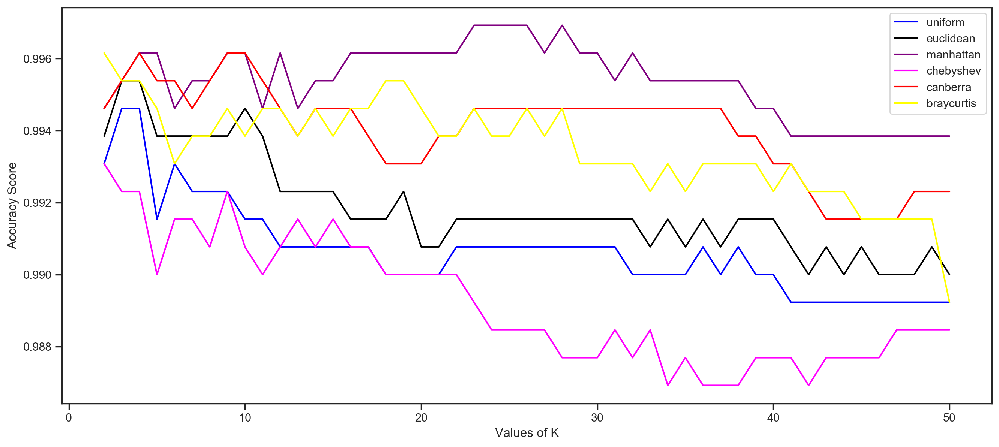

In [203]:
%matplotlib inline
plt.figure(figsize=(16,7),dpi=200)
plt.plot('k','uniform',data=accscore_df[1:],color='blue')
plt.plot('k','euclidean',data=accscore_df[1:],color='black')
plt.plot('k','manhattan',data=accscore_df[1:],color='purple')
plt.plot('k','chebyshev',data=accscore_df[1:],color='magenta')
#plt.plot('k','hamming',data=accscore_df[1:],color='green')
plt.plot('k','canberra',data=accscore_df[1:],color='red')
plt.plot('k','braycurtis',data=accscore_df[1:],color='yellow')
plt.xlabel('Values of K')
plt.ylabel('Accuracy Score')
plt.legend()
plt.show()

- Manhattan performed better than other weights with normalized data when label is Color.

### Label = Quality and Unnormalized

In [211]:
X = wine[D].values

y = np.ravel(wine[[L]])

In [212]:
#Train,Test split of unnormalized data.
ran = 42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = ran) 

In [213]:
#applying euclidean,manhattan,chebyshev,hamming,canberra and braycurtis weights.
#for value of k from 1 to 50

n_neighborslist = list(range(1,51))
metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']
accscore = []
acc = []

for k in n_neighborslist:
    neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k)
    neigh_color.fit(X_train, y_train)
    y_pred = neigh_color.predict(X_test)
    acc.append(accuracy_score(y_test, y_pred))
accscore.append(acc)


for m in metrics:
    acc = []
    for k in n_neighborslist:
        neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k,weights = 'distance',metric=m)
        neigh_color.fit(X_train, y_train)
        y_pred = neigh_color.predict(X_test)
        acc.append(accuracy_score(y_test, y_pred))
    accscore.append(acc)

In [214]:
accscore_df = pd.DataFrame(np.array(accscore).T,columns=['uniform','euclidean','manhattan','chebyshev',
                                                         'hamming','canberra','braycurtis'])
accscore_df['k'] = [k for k in range(1,51)]
print(accscore_df.shape)
accscore_df.head()

(50, 8)


,uniform,euclidean,manhattan,chebyshev,hamming,canberra,braycurtis,k
0,0.581538,0.581538,0.581538,0.571538,0.571538,0.621538,0.580769,1
1,0.510769,0.581538,0.581538,0.566923,0.584615,0.621538,0.580769,2
2,0.493846,0.579231,0.585385,0.566923,0.566923,0.639231,0.583846,3
3,0.480000,0.580769,0.588462,0.576154,0.583846,0.632308,0.592308,4
4,0.480000,0.593846,0.594615,0.593077,0.590000,0.636154,0.592308,5


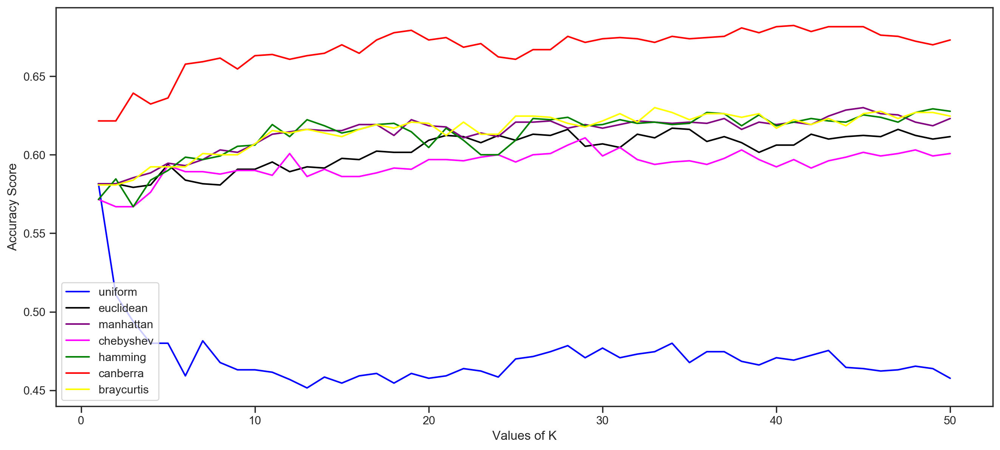

In [215]:
%matplotlib inline
plt.figure(figsize=(16,7),dpi=200)
plt.plot('k','uniform',data=accscore_df,color='blue')
plt.plot('k','euclidean',data=accscore_df,color='black')
plt.plot('k','manhattan',data=accscore_df,color='purple')
plt.plot('k','chebyshev',data=accscore_df,color='magenta')
plt.plot('k','hamming',data=accscore_df,color='green')
plt.plot('k','canberra',data=accscore_df,color='red')
plt.plot('k','braycurtis',data=accscore_df,color='yellow')
plt.xlabel('Values of K')
plt.ylabel('Accuracy Score')
plt.legend()
plt.show()

### Label = Quality and Normalized

In [110]:
#Train,Test split of normalized data.
from sklearn.preprocessing import StandardScaler
X_sir = wine[D].values
y_sir_l = np.ravel(wine[[L]])
X_sir_norm = StandardScaler().fit_transform(X_sir)
X_train_znorm, X_test_znorm, y_train_znorm, y_test_znorm = train_test_split(X_sir_norm, y_sir_l, test_size=0.2, random_state = 42)

In [112]:
#applying euclidean,manhattan,chebyshev,hamming,canberra and braycurtis weights for normalized data.
#for value of k from 1 to 50

n_neighborslist = list(range(1,51))
metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']
accscore = []
acc = []

for k in n_neighborslist:
    neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k)
    neigh_color.fit(X_train_znorm, y_train_znorm)
    y_pred = neigh_color.predict(X_test_znorm)
    acc.append(accuracy_score(y_test_znorm, y_pred))
accscore.append(acc)


for m in metrics:
    acc = []
    for k in n_neighborslist:
        neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k,weights = 'distance',metric=m)
        neigh_color.fit(X_train_znorm, y_train_znorm)
        y_pred = neigh_color.predict(X_test_znorm)
        acc.append(accuracy_score(y_test_znorm, y_pred))
    accscore.append(acc)


In [113]:
accscore_df = pd.DataFrame(np.array(accscore).T,columns=['uniform','euclidean','manhattan','chebyshev',
                                                         'hamming','canberra','braycurtis'])
accscore_df['k'] = [k for k in range(1,51)]
print(accscore_df.shape)
accscore_df.head()

(50, 8)


,uniform,euclidean,manhattan,chebyshev,hamming,canberra,braycurtis,k
0,0.630000,0.630000,0.640000,0.626923,0.573846,0.625385,0.638462,1
1,0.581538,0.630000,0.640000,0.627692,0.573077,0.625385,0.638462,2
2,0.566923,0.661538,0.658462,0.646923,0.580000,0.636923,0.648462,3
3,0.570000,0.660000,0.652308,0.659231,0.603846,0.646923,0.661538,4
4,0.555385,0.672308,0.658462,0.656923,0.606154,0.643846,0.671538,5


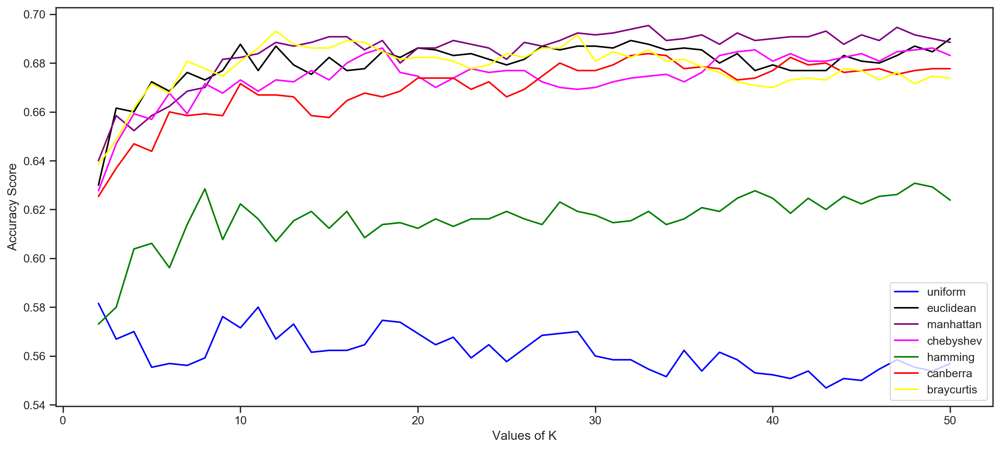

In [114]:
%matplotlib inline
plt.figure(figsize=(16,7),dpi=200)
plt.plot('k','uniform',data=accscore_df[1:],color='blue')
plt.plot('k','euclidean',data=accscore_df[1:],color='black')
plt.plot('k','manhattan',data=accscore_df[1:],color='purple')
plt.plot('k','chebyshev',data=accscore_df[1:],color='magenta')
plt.plot('k','hamming',data=accscore_df[1:],color='green')
plt.plot('k','canberra',data=accscore_df[1:],color='red')
plt.plot('k','braycurtis',data=accscore_df[1:],color='yellow')
plt.xlabel('Values of K')
plt.ylabel('Accuracy Score')
plt.legend()
plt.show()

- For normalized data, Manhattan weights gave  accuracy , close to 70%.
- uniform gave lowest accuracy for normalized data when compared to other weights.
- Manhattan with normalized data is giving maximum accuracy.

## Feature Selection

### Subsetting - Taking Color as Label (Bonus)

- Performing all possible feature Combinations for 11 features. Taking only 4 features from 11 features that is, applying combination formulae.
$\binom {11}{4}=\frac{11!}{4!(11-4)!}$ 
- This gives 330 possible combinations of 4 features from 11 features

In [306]:
#importing itertools for combinations
from itertools import combinations

In [307]:
#index list for 11 features
index_list = [0,1,2,3,4,5,6,7,8,9,10]

In [32]:
#defined function for performing combinations
#applying euclidean,manhattan,chebyshev,hamming,canberra and braycurtis weights.
def compute_accuracy(X,y,k):
    n_neighborslist = list(range(1,51))
    metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']
    accscore = []
    acc = []
    acc_k = []
    comb = combinations(index_list,k)
    count = 1
    for c in comb:
        subset_acc = []
        c = list(c)
        X_comb = X.iloc[:,c]
        subset = [x for x in X_comb.columns]
        subset_acc.append(subset)

        X_comb_train, X_comb_test, y_comb_train, y_comb_test = train_test_split(X_comb, y, test_size=0.2, random_state = 42)

        for m in metrics:
            acc = []

            neigh_color = neighbors.KNeighborsClassifier(n_neighbors=10,weights = 'distance',metric=m)
            neigh_color.fit(X_comb_train, y_comb_train[C])
            y_pred = neigh_color.predict(X_comb_test)
            acc.append(accuracy_score(y_comb_test[C], y_pred))
            accscore.append(acc)
        subset_acc.append(accuracy_score(y_comb_test[C], y_pred))

        acc_k.append(subset_acc)
        print(count)
        count+=1
    return acc_k

- The Above computation becomes very time consuming when applying values of K from 1 to 50 for each weights. (Data is unnormalized).
- It takes almost 3 minutes for performing 1 combination out of 330 with all values of K (1,50) for each weight.
- Hence gave parameter n_neighbors to kNN, that is k = 10 to reduce computation time. But performed computation for each weight.

In [ ]:
compute_accuracy(X,y,4)

- Out of 330 performed combinations , extracting only best list of combination below which gives maximum accuracy.

In [35]:
acc_4 = [x[-1] for x in acc_list]
best_4 = [x[0] for x in acc_list if x[-1] == max(acc_4)]
print(best_4)
print(max(acc_4))

[['fixed acidity', 'volatile acidity', 'chlorides', 'pH']]
0.9661538461538461


- As seen above got 96.6% accuracy for features 'fixed acidity', 'volatile acidity', 'chlorides' and 'pH'. (Value of k =10)
- Could have achieved higher accuracy, if performed computation for all values of k. But due to time constrain , I could not perform that as it could takes more than 16 hours process to complete.

### Subsetting = Taking Quality as Label (Bonus)

In [333]:
cols = list(X_train.columns)

In [336]:
comb = combinations(cols,4)
k=20
acc_comb_quality = []
for c in comb:
    c =list(c)
    xcomb_train = X_train.loc[:,c]
    xcomb_test = X_test.loc[:,c]
    
    acc = []
    neigh_quality = neighbors.KNeighborsClassifier(n_neighbors=k)
    neigh_quality.fit(xcomb_train, y_train[L])
    y_pred = neigh_quality.predict(xcomb_test)
    acc.append(accuracy_score(y_test[L], y_pred))
    
    metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']
    for m in metrics:
        neigh_quality = neighbors.KNeighborsClassifier(n_neighbors=k,weights = 'distance',metric=m)
        neigh_quality.fit(xcomb_train, y_train[L])
        y_pred = neigh_quality.predict(xcomb_test)
        acc.append(accuracy_score(y_test[L], y_pred))
    acc.append(c)
    acc_comb_quality.append(acc)
    

In [340]:
acc_comb_quality_df = pd.DataFrame(np.array(acc_comb_quality),columns=['uniform','euclidean','manhattan',
                                                                       'chebyshev','hamming','canberra','braycurtis','subset'])
#accscore_df['k'] = [k for k in range(1,51)]
print(acc_comb_quality_df.shape)
acc_comb_quality_df.head()

(330, 8)


,uniform,euclidean,manhattan,chebyshev,hamming,canberra,braycurtis,subset
0,0.482308,0.610769,0.615385,0.601538,0.583077,0.623846,0.611538,"[fixed acidity, volatile acidity, citric acid,..."
1,0.476154,0.608462,0.599231,0.602308,0.611538,0.624615,0.6,"[fixed acidity, volatile acidity, citric acid,..."
2,0.449231,0.590769,0.594615,0.596154,0.592308,0.612308,0.593077,"[fixed acidity, volatile acidity, citric acid,..."
3,0.454615,0.591538,0.589231,0.603846,0.588462,0.614615,0.59,"[fixed acidity, volatile acidity, citric acid,..."
4,0.475385,0.607692,0.6,0.600769,0.6,0.600769,0.601538,"[fixed acidity, volatile acidity, citric acid,..."


In [346]:
uni = acc_comb_quality_df['uniform']
euc = acc_comb_quality_df['euclidean']
man = acc_comb_quality_df['manhattan']
cheb = acc_comb_quality_df['chebyshev']
ham = acc_comb_quality_df['hamming']
can = acc_comb_quality_df['canberra']
bray = acc_comb_quality_df['braycurtis']

print('uniform')
print(acc_comb_quality_df[uni == max(uni)])
print('euclidean')
print(acc_comb_quality_df[euc == max(euc)])
print('manhattan')
print(acc_comb_quality_df[man == max(man)])
print('chebyshev')
print(acc_comb_quality_df[cheb == max(cheb)])
print('hamming')
print(acc_comb_quality_df[ham == max(ham)])
print('canberra')
print(acc_comb_quality_df[can == max(can)])
print('braycurtis')
print(acc_comb_quality_df[bray == max(bray)])

uniform
      uniform euclidean manhattan chebyshev   hamming  canberra braycurtis  \
203  0.569231      0.69  0.683846  0.684615  0.588462  0.663077   0.684615   

                                         subset  
203  [volatile acidity, pH, sulphates, alcohol]  
euclidean
      uniform euclidean manhattan chebyshev   hamming  canberra braycurtis  \
203  0.569231      0.69  0.683846  0.684615  0.588462  0.663077   0.684615   

                                         subset  
203  [volatile acidity, pH, sulphates, alcohol]  
manhattan
      uniform euclidean manhattan chebyshev   hamming  canberra braycurtis  \
147  0.547692  0.672308  0.684615  0.659231  0.596154  0.656154   0.681538   

                                                subset  
147  [volatile acidity, citric acid, sulphates, alc...  
chebyshev
      uniform euclidean manhattan chebyshev   hamming  canberra braycurtis  \
203  0.569231      0.69  0.683846  0.684615  0.588462  0.663077   0.684615   

                    

- Taking Quality as label and including all the features graph was plotted some cells above.
- Canberra was giving maximum accuracy , but was less than 60%.
- But above, we can clearly see for canberra maximum accuracy is 67% for features [volatile acidity,chlorides,sulphates and alcohol]
- Same is for all weights. I got more accuracy for all weights taking only 4 features compared to all features.

## Feature Extraction

### PCA and Label = Colour

In [58]:
from scipy import stats

In [59]:
from sklearn.decomposition import PCA

In [115]:
X2 = wine[D].values
y2 = np.ravel(wine[[C]])
X2= stats.zscore(X2)
ran = 42
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state = ran)
pca = PCA(random_state=42)
X_train_pca = pca.fit_transform(X_train2)

In [116]:
X_test_pca = pca.fit_transform(X_test2)

### Projecting Data of first two PCA Components - Colour Label

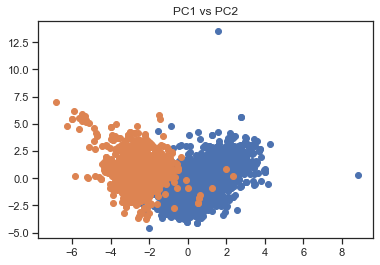

In [117]:
b = y_train2 == 0
c = y_train2 == 1
k = y_train2 == 2
r = y_train2 == 3
g = y_train2 == 4
plt.scatter(X_train_pca[b,0],X_train_pca[b,1])
plt.scatter(X_train_pca[c,0],X_train_pca[c,1])
plt.scatter(X_train_pca[k,0],X_train_pca[k,1])
plt.scatter(X_train_pca[r,0],X_train_pca[r,1])
plt.scatter(X_train_pca[g,0],X_train_pca[g,1])
plt.title("PC1 vs PC2")
plt.show()

In [119]:
n_neighborslist = list(range(1,51))
# col_names=['uniform','Euclidean','Manhattan','Chebyshev']
metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']

accscore = []
acc = []

for k in n_neighborslist:
    neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k)
    neigh_color.fit(X_train_pca, y_train2)
    y_pred = neigh_color.predict(X_test_pca)
    acc.append(accuracy_score(y_test2, y_pred))
accscore.append(acc)

for m in metrics:
    acc = []
    for k in n_neighborslist:
        neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k,weights = 'distance',metric=m)
        neigh_color.fit(X_train_pca, y_train2)
        y_pred = neigh_color.predict(X_test_pca)
        acc.append(accuracy_score(y_test2, y_pred))
    accscore.append(acc)

In [120]:
accscore_df = pd.DataFrame(np.array(accscore).T,columns=['uniform','euclidean','manhattan','chebyshev',
                                                         'hamming','canberra','braycurtis'])
accscore_df['k'] = [k for k in range(1,51)]
print(accscore_df.shape)
accscore_df.head()

(50, 8)


,uniform,euclidean,manhattan,chebyshev,hamming,canberra,braycurtis,k
0,0.493077,0.493077,0.497692,0.487692,0.241538,0.550769,0.483077,1
1,0.518462,0.493077,0.497692,0.487692,0.758462,0.550769,0.483077,2
2,0.495385,0.495385,0.501538,0.492308,0.241538,0.540769,0.476154,3
3,0.503077,0.495385,0.499231,0.491538,0.241538,0.538462,0.474615,4
4,0.490000,0.490000,0.500000,0.490000,0.241538,0.534615,0.478462,5


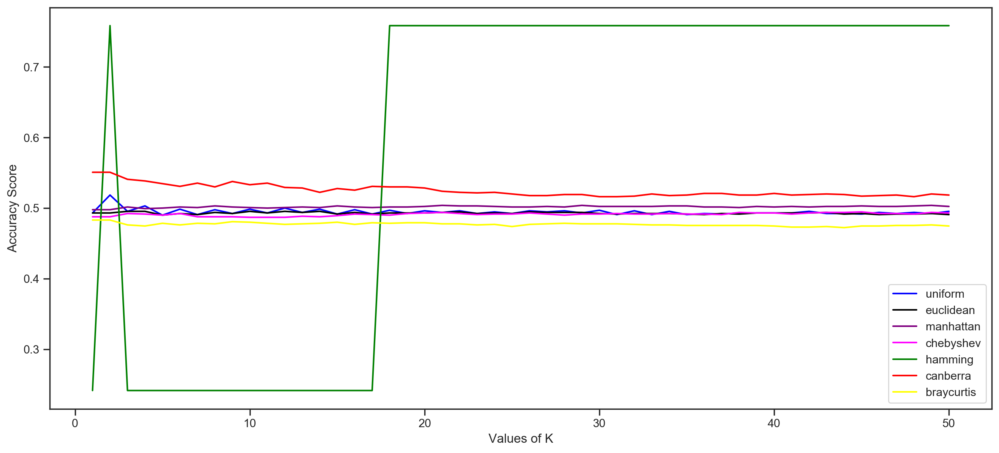

In [121]:
%matplotlib inline
plt.figure(figsize=(16,7),dpi=200)
plt.plot('k','uniform',data=accscore_df,color='blue')
plt.plot('k','euclidean',data=accscore_df,color='black')
plt.plot('k','manhattan',data=accscore_df,color='purple')
plt.plot('k','chebyshev',data=accscore_df,color='magenta')
plt.plot('k','hamming',data=accscore_df,color='green')
plt.plot('k','canberra',data=accscore_df,color='red')
plt.plot('k','braycurtis',data=accscore_df,color='yellow')
plt.xlabel('Values of K')
plt.ylabel('Accuracy Score')
plt.legend()
plt.show()

- When performing PCA with colour label , there was reduction in accuracy that is less than 80% with weight scheme equal to hamming. 
- From above hamming performed well and gave accuracy of almost 96% with unnormalized feature and without applying PCA.
- The reason for this could be PCA does not consider labels
- In general, applying PCA before building a model that is 'kNN' will not help to make the model perform better.

- This is because PCA is an algorithm that does not consider the prediction target into account. PCA will treat the feature has large variance as important features, but the feature has large variance can have noting to do with the prediction target.

- This means, you can produce a lot of useless features and eliminate useful features after PCA.

### PCA and Label = Quality

In [122]:
X2 = wine[D].values
y2 = wine[L]
X2 = stats.zscore(X2)
X_sir = wine[D].values
y_sir_l = np.ravel(wine[[L]])
X_sir_norm = StandardScaler().fit_transform(X_sir)
ran = 42
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_sir_norm, y_sir_l, test_size=0.2, random_state = ran)
pca = PCA(random_state=42)
X_train_pca = pca.fit_transform(X_train2)

In [123]:
X_test_pca = pca.fit_transform(X_test2)

### Projecting Data of first two PCA Components - Quality Label

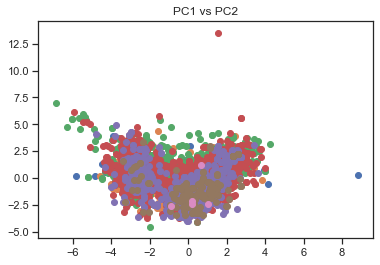

In [124]:
b = y_train2 == 3
c = y_train2 == 4
k = y_train2 == 5
r = y_train2 == 6
g = y_train2 == 7
z = y_train2 == 8
y = y_train2 == 9
plt.scatter(X_train_pca[b,0],X_train_pca[b,1])
plt.scatter(X_train_pca[c,0],X_train_pca[c,1])
plt.scatter(X_train_pca[k,0],X_train_pca[k,1])
plt.scatter(X_train_pca[r,0],X_train_pca[r,1])
plt.scatter(X_train_pca[g,0],X_train_pca[g,1])
plt.scatter(X_train_pca[z,0],X_train_pca[z,1])
plt.scatter(X_train_pca[y,0],X_train_pca[y,1])
plt.title("PC1 vs PC2")
plt.show()

In [125]:
n_neighborslist = list(range(1,51))
# col_names=['uniform','Euclidean','Manhattan','Chebyshev']
metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']
# accarray = np.zeros((len(n_neighborslist),1))
accscore = []
acc = []

for k in n_neighborslist:
    neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k)
    neigh_color.fit(X_train_pca, y_train2)
    y_pred = neigh_color.predict(X_test_pca)
    acc.append(accuracy_score(y_test2, y_pred))
accscore.append(acc)


for m in metrics:
    acc = []
    for k in n_neighborslist:
        neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k,weights = 'distance',metric=m)
        neigh_color.fit(X_train_pca, y_train2)
        y_pred = neigh_color.predict(X_test_pca)
        acc.append(accuracy_score(y_test2, y_pred))
    accscore.append(acc)

In [126]:
accscore_df = pd.DataFrame(np.array(accscore).T,columns=['uniform','euclidean','manhattan','chebyshev',
                                                         'hamming','canberra','braycurtis'])
accscore_df['k'] = [k for k in range(1,51)]
print(accscore_df.shape)
accscore_df.head()

(50, 8)


,uniform,euclidean,manhattan,chebyshev,hamming,canberra,braycurtis,k
0,0.390000,0.390000,0.407692,0.368462,0.035385,0.401538,0.403846,1
1,0.411538,0.390000,0.407692,0.368462,0.035385,0.401538,0.403846,2
2,0.405385,0.403846,0.408462,0.396923,0.035385,0.416154,0.420769,3
3,0.420000,0.426923,0.417692,0.408462,0.035385,0.428462,0.428462,4
4,0.427692,0.431538,0.420000,0.416154,0.323077,0.437692,0.423077,5


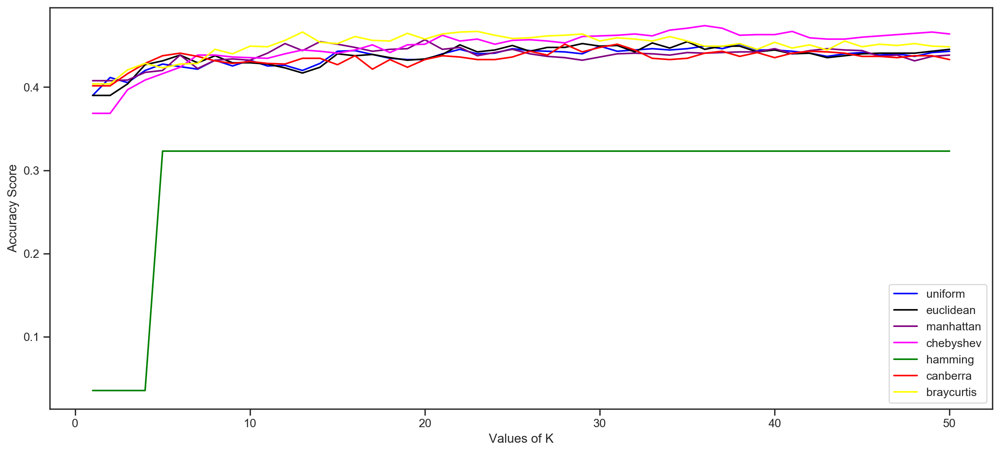

In [127]:
%matplotlib inline
plt.figure(figsize=(16,7),dpi=200)
plt.plot('k','uniform',data=accscore_df,color='blue')
plt.plot('k','euclidean',data=accscore_df,color='black')
plt.plot('k','manhattan',data=accscore_df,color='purple')
plt.plot('k','chebyshev',data=accscore_df,color='magenta')
plt.plot('k','hamming',data=accscore_df,color='green')
plt.plot('k','canberra',data=accscore_df,color='red')
plt.plot('k','braycurtis',data=accscore_df,color='yellow')
plt.xlabel('Values of K')
plt.ylabel('Accuracy Score')
plt.legend()
plt.show()

- When performing PCA with quality label , there was even more reduction in accuracy that is less than 50%.
- PCA is not performing feature extraction for classification and as number of labels increases that is 5 for quality label, PCA will perform poorly.
- PCA will treat the feature has large variance as important features, but the feature has large variance can have noting to do with the prediction target.
- This means, you can produce a lot of useless features and eliminate useful features after PCA.
- Hence, accuracy decreases even more with quality as label.

### LDA and Label = Colour

In [128]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
lda = LDA()
X2 = wine[D].values
y2 = np.ravel(wine[[C]])
X2= stats.zscore(X2)
ran = 42
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_sir_norm, y2, test_size=0.2, random_state = ran)
X_train_lda = lda.fit_transform(X_train2,y_train2)
X_test_lda = lda.fit_transform(X_test2,y_test2)

### Projecting Data of First two LDA Components - Colour Label

In [49]:
n_neighborslist = list(range(1,51))
# col_names=['uniform','Euclidean','Manhattan','Chebyshev']
metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']
# accarray = np.zeros((len(n_neighborslist),1))
accscore = []
acc = []

for k in n_neighborslist:
    neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k)
    neigh_color.fit(X_train_lda, y_train2)
    y_pred = neigh_color.predict(X_test_lda)
    acc.append(accuracy_score(y_test2, y_pred))
accscore.append(acc)
#     acc.at[k,col_names[0]] = accscore

for m in metrics:
    acc = []
    for k in n_neighborslist:
        neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k,weights = 'distance',metric=m)
        neigh_color.fit(X_train_lda, y_train2)
        y_pred = neigh_color.predict(X_test_lda)
        acc.append(accuracy_score(y_test2, y_pred))
    accscore.append(acc)

In [50]:
accscore_df = pd.DataFrame(np.array(accscore).T,columns=['uniform','euclidean','manhattan','chebyshev',
                                                         'hamming','canberra','braycurtis'])
accscore_df['k'] = [k for k in range(1,51)]
print(accscore_df.shape)
accscore_df.head()

(50, 8)


,uniform,euclidean,manhattan,chebyshev,hamming,canberra,braycurtis,k
0,0.987692,0.987692,0.987692,0.987692,0.758462,0.988462,0.988462,1
1,0.990000,0.987692,0.987692,0.987692,0.758462,0.988462,0.988462,2
2,0.993077,0.989231,0.989231,0.989231,0.758462,0.989231,0.989231,3
3,0.993846,0.991538,0.991538,0.991538,0.758462,0.991538,0.991538,4
4,0.994615,0.991538,0.991538,0.991538,0.758462,0.991538,0.991538,5


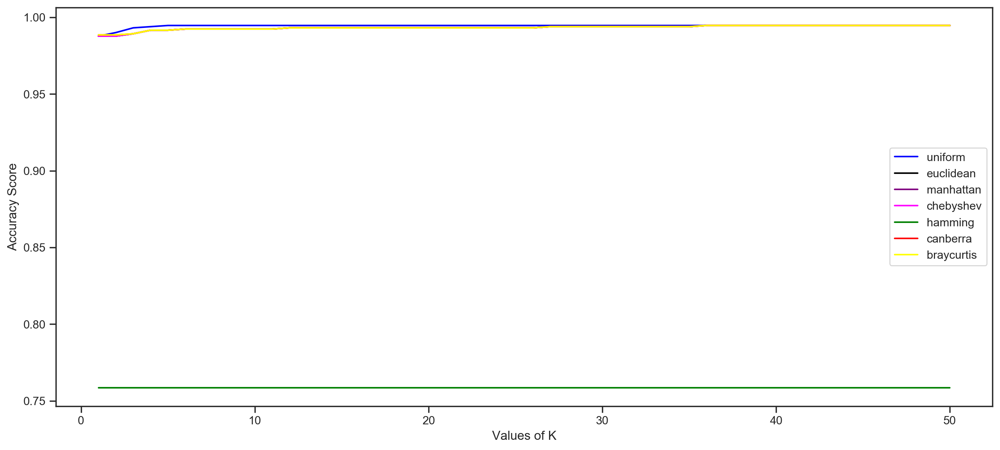

In [51]:
%matplotlib inline
plt.figure(figsize=(16,7),dpi=200)
plt.plot('k','uniform',data=accscore_df,color='blue')
plt.plot('k','euclidean',data=accscore_df,color='black')
plt.plot('k','manhattan',data=accscore_df,color='purple')
plt.plot('k','chebyshev',data=accscore_df,color='magenta')
#plt.plot('k','hamming',data=accscore_df,color='green')
plt.plot('k','canberra',data=accscore_df,color='red')
plt.plot('k','braycurtis',data=accscore_df,color='yellow')
plt.xlabel('Values of K')
plt.ylabel('Accuracy Score')
plt.legend()
plt.show()

- All the weights performed well , when LDA is used. This is because LDA not only reduces dimensionality but also helps in classification.
- This helps kNN algorithm to perform better.

### LDA and Label = Quality

In [155]:
X2 = wine[D].values
y2 = np.ravel(wine[[L]])
X2= stats.zscore(X2)
lda = LDA(n_components=5)
ran = 42
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state = ran)
X_train_lda = lda.fit_transform(X_train2,y_train2)
X_test_lda = lda.fit_transform(X_test2,y_test2)

In [156]:
n_neighborslist = list(range(1,51))
# col_names=['uniform','Euclidean','Manhattan','Chebyshev']
metrics = ['euclidean','manhattan','chebyshev','hamming','canberra','braycurtis']
# accarray = np.zeros((len(n_neighborslist),1))
accscore = []
acc = []
#add multiple plots to same chart, one for each weighting approach
# acc=pd.DataFrame(accarray, columns=col_names)

for k in n_neighborslist:
    neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k)
    neigh_color.fit(X_train_lda, y_train2)
    y_pred = neigh_color.predict(X_test_lda)
    acc.append(accuracy_score(y_test2, y_pred))
accscore.append(acc)
#     acc.at[k,col_names[0]] = accscore

for m in metrics:
    acc = []
    for k in n_neighborslist:
        neigh_color = neighbors.KNeighborsClassifier(n_neighbors=k,weights = 'distance',metric=m)
        neigh_color.fit(X_train_lda, y_train2)
        y_pred = neigh_color.predict(X_test_lda)
        acc.append(accuracy_score(y_test2, y_pred))
    accscore.append(acc)

In [157]:
accscore_df = pd.DataFrame(np.array(accscore).T,columns=['uniform','euclidean','manhattan','chebyshev',
                                                         'hamming','canberra','braycurtis'])
accscore_df['k'] = [k for k in range(1,51)]
print(accscore_df.shape)
accscore_df.head()

(50, 8)


,uniform,euclidean,manhattan,chebyshev,hamming,canberra,braycurtis,k
0,0.439231,0.439231,0.430769,0.428462,0.445385,0.413846,0.420000,1
1,0.446154,0.439231,0.430769,0.428462,0.001538,0.413846,0.420000,2
2,0.436154,0.446154,0.443077,0.445385,0.001538,0.429231,0.451538,3
3,0.475385,0.458462,0.461538,0.456923,0.001538,0.446154,0.467692,4
4,0.477692,0.469231,0.463846,0.473846,0.001538,0.446923,0.468462,5


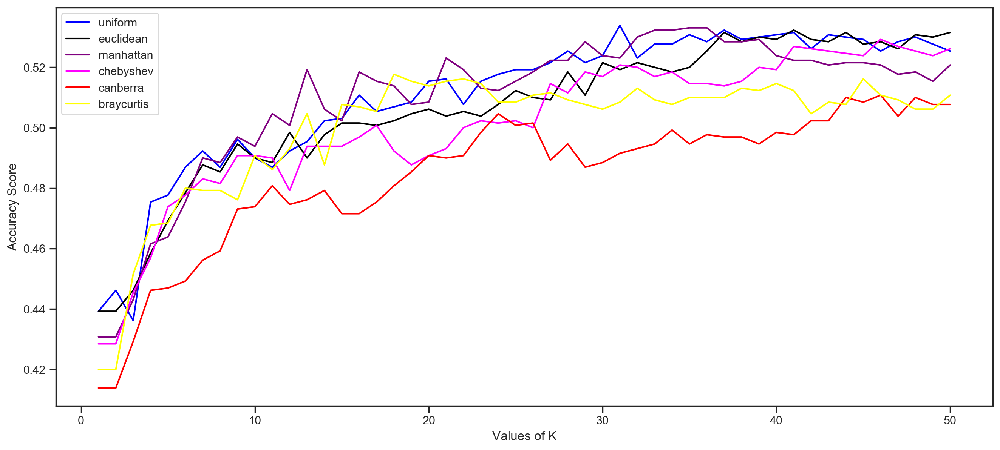

In [158]:
%matplotlib inline
plt.figure(figsize=(16,7),dpi=200)
plt.plot('k','uniform',data=accscore_df,color='blue')
plt.plot('k','euclidean',data=accscore_df,color='black')
plt.plot('k','manhattan',data=accscore_df,color='purple')
plt.plot('k','chebyshev',data=accscore_df,color='magenta')
#plt.plot('k','hamming',data=accscore_df,color='green')
plt.plot('k','canberra',data=accscore_df,color='red')
plt.plot('k','braycurtis',data=accscore_df,color='yellow')
plt.xlabel('Values of K')
plt.ylabel('Accuracy Score')
plt.legend()
plt.show()

### Projecting Data of first two LDA Components - Quality Label

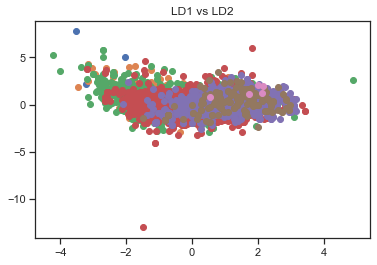

In [159]:
b = y_train2 == 3
c = y_train2 == 4
k = y_train2 == 5
r = y_train2 == 6
g = y_train2 == 7
z = y_train2 == 8
y = y_train2 == 9
plt.scatter(X_train_lda[b,0],X_train_lda[b,1])
plt.scatter(X_train_lda[c,0],X_train_lda[c,1])
plt.scatter(X_train_lda[k,0],X_train_lda[k,1])
plt.scatter(X_train_lda[r,0],X_train_lda[r,1])
plt.scatter(X_train_lda[g,0],X_train_lda[g,1])
plt.scatter(X_train_lda[z,0],X_train_lda[z,1])
plt.scatter(X_train_lda[y,0],X_train_lda[y,1])
plt.title("LD1 vs LD2")
plt.show()

# Question 2

In [136]:
df = pd.read_csv("DataB.csv")

In [137]:
Y = df.loc[:, 'gnd']
X1 = df.drop(['Unnamed: 0'], axis=1)
X = X1.drop(['gnd'],axis=1)

In [138]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer

X_std = StandardScaler().fit_transform(X)
#X_std = Normalizer().fit_transform(X)
pca = PCA()
X_pca = pca.fit_transform(X_std)

In [139]:
print(X_std.shape)
print(X_pca.shape)

(2066, 784)
(2066, 784)


In [141]:
from numpy import linalg 
X_std_cov = np.cov(X_std.T)

eigen_val,eigen_vec = np.linalg.eig(X_std_cov)
# print('\n EigenValues \n%s' %eigen_val)
# print('\n EigenVector \n%s' %eigen_vec)

## Scree Plot

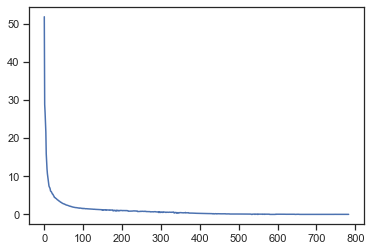

In [142]:
plt.plot(eigen_val)
plt.show()

- The scree plot of Principal Components of PCA are shown above.
- It is visible that first PC contributes to more than 50% of Variance. 
- Contribution of second component decreases followed by other components.
- It seems to be quite obvious that rate of change of slope decrease after 10 principal components.
- Hence, remaining components does not contribute much in obtaining variance. Thus, cut-off with 10 eigenvalues is good.
- All those components corresponds to the top 10 eigenvalues will have maximum variance compared to latter components.

## Scatterplot of top 20 EigenValues

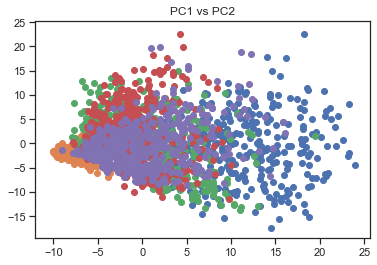

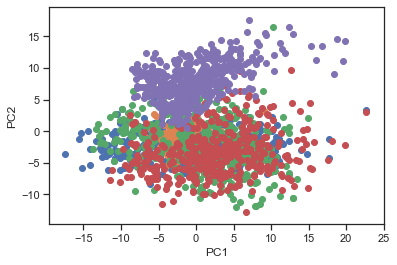

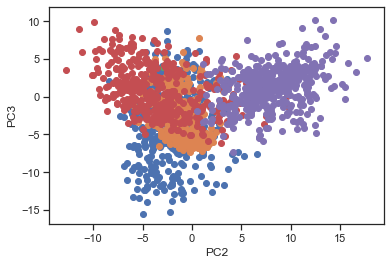

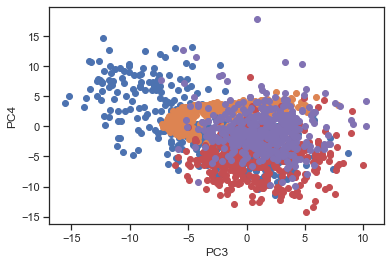

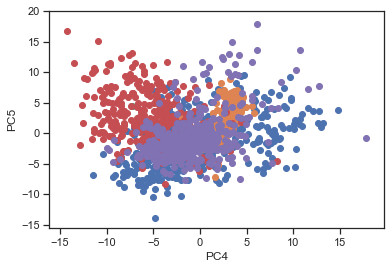

...

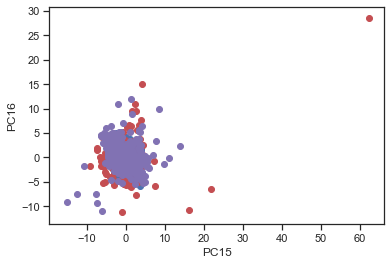

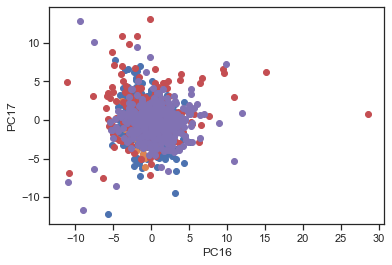

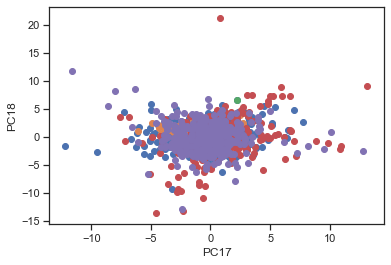

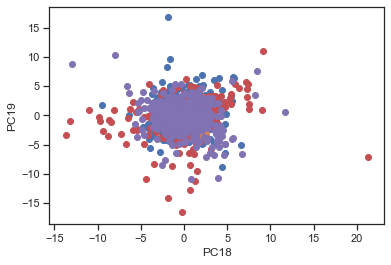

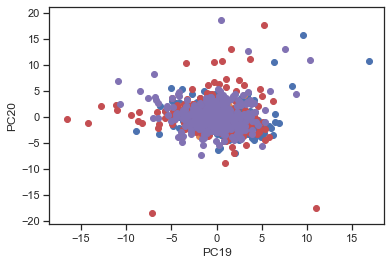

In [143]:
b = Y == 0
c = Y == 1
k = Y == 2
r = Y == 3
g = Y == 4
plt.scatter(X_pca[b,0],X_pca[b,1])
plt.scatter(X_pca[c,0],X_pca[c,1])
plt.scatter(X_pca[k,0],X_pca[k,1])
plt.scatter(X_pca[r,0],X_pca[r,1])
plt.scatter(X_pca[g,0],X_pca[g,1])
plt.title("PC1 vs PC2")
plt.show()

for i in range(1,20):
    plt.scatter(X_pca[b,i],X_pca[b,i+1])
    plt.scatter(X_pca[c,i],X_pca[c,i+1])
    plt.scatter(X_pca[k,i],X_pca[k,i+1])
    plt.scatter(X_pca[r,i],X_pca[r,i+1])
    plt.scatter(X_pca[g,i],X_pca[g,i+1])
    k=i+1
    plt.xlabel("PC%d"%i)
    plt.ylabel("PC%d"%k)
    #plt.title("PC1 vs PC2")
    plt.show()

- The above figure shows scatterplot of 1st PC vs 2nd ,upto 19th PC vs 20th PC.
- First 4 scatter plots contribute maximum to seperation of classes.
- After that, scatter plot becomes all messed up and it becomes difficult to interpret classes.
- This bolsters the above analysis of scree plot that , first 10 eigenvalues contribute maximum to variance.

## Scatterplot of 1st vs 2nd PC and 5th vs 6th PC

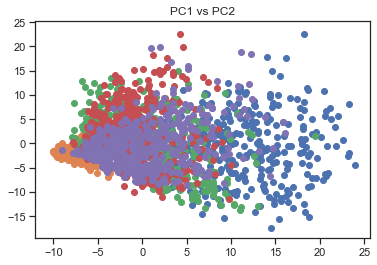

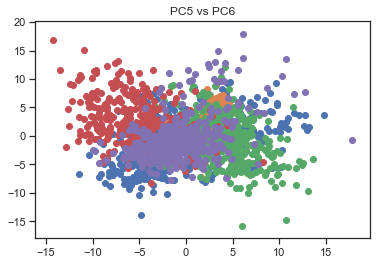

In [145]:
b = Y == 0
c = Y == 1
k = Y == 2
r = Y == 3
g = Y == 4
plt.scatter(X_pca[b,0],X_pca[b,1])
plt.scatter(X_pca[c,0],X_pca[c,1])
plt.scatter(X_pca[k,0],X_pca[k,1])
plt.scatter(X_pca[r,0],X_pca[r,1])
plt.scatter(X_pca[g,0],X_pca[g,1])
plt.title("PC1 vs PC2")
plt.show()


plt.scatter(X_pca[b,4],X_pca[b,5])
plt.scatter(X_pca[c,4],X_pca[c,5])
plt.scatter(X_pca[k,4],X_pca[k,5])
plt.scatter(X_pca[r,4],X_pca[r,5])
plt.scatter(X_pca[g,4],X_pca[g,5])
plt.title("PC5 vs PC6")
plt.show()

- Above is the scatter plot of 1st PC vs 2nd PC and 5th PC vs 6th PC.
- First Scatterplot obtains maximum variance which helps in seperating classes.
- Second scatterplot is bit hard to interpret , as data points becomes all messed up as variance reduces. This happens because contribution to 5th and 6th principal components in obtaining variance is less than 15% , while for 1st and 2nd Principal Component is more than 50%.

## PCA

- Below is the manual implementation of PCA without using Scikit-Learn Library

In [230]:
%%time
X_std = StandardScaler().fit_transform(X)
#Centering data by subtracting Mean of Standardized Data from Standardized Data
X_mean_std = X_std - X_std.mean()
X_mean_std.shape #(2066,784)
#Taking Transpose of Centered Data
X_mean_std_T = X_mean_std.T
X_mean_std_T.shape #(784,2066)
#Matrix Multiplication of Mean Standardized Data and its Transpose
X_mean_std_T = np.matrix(X_mean_std_T)
X_matrix = np.matmul(X_mean_std_T,X_mean_std_T.T) #(784,784)
#Computing EigenValues and EigenVectors from np.linalg.eigh function
eigen_values,eigen_vector = np.linalg.eigh(X_matrix)
#eigen_values = np.flip(eigen_values)
eigen_vector = np.flip(eigen_vector,axis=1)

Xca = eigen_vector[:,:5]
#Taking actual output of PCA by Matrix Multiplication of Transpose of EigenVector and Transpose of Mean Standardized Data
output = np.matmul(Xca.T,X_mean_std_T)
#Printing Output of as Transpose of Output
output.T.shape #(2066,784)

Wall time: 245 ms


(2066, 5)

In [231]:
print(output.T)

[[ 9.97069222  6.18172201 -4.99286326 -4.39487911 -2.77786998]
 [11.41599978  6.94158705 -5.06302886 -4.24217827 -1.84494034]
 [ 3.69011918  4.69309729 -2.9086564   3.93509384 -6.81180551]
 ...
 [-0.34942153  0.93368106  8.10744188  0.82426805 -2.81443825]
 [-3.11526327  2.09047425  6.27251911 -1.52982263 -0.03630758]
 [-5.64409375 -0.24616663  4.14018317  2.23890472 -2.47709658]]


## Dual PCA

- Below is the manual implementation of Dual PCA without using Scikit-Learn Library

In [232]:
%%time
#Computing EigenVector 'V' by matrix Multiplication of Standardized Data and its Transpose
V = X_mean_std@X_mean_std_T
V.shape #(2066,2066)
#Computing EigenValues and EigenVectors from np.linalg.eigh function
eigen_values , eigen_vectors  = np.linalg.eigh(V)
eigen_values = np.flip(eigen_values)
#Flipping EigenVectors for descending order 
eigen_vectors = np.flip(eigen_vectors,axis=1)
#print(eigen_values)
#print(eigen_vectors)
eigen_values = eigen_values[0:5]
#Calculating Sigma which is diagonal matrix of Squareroot of top EigenValues
Sigma = np.sqrt(np.diag(eigen_values))
eigen_vectors.shape
eigen_vectors = eigen_vectors[:,0:5]
#Computing Actual output 'Y' which is matrix multiplication of Sigma and Transpose of EigenVectors
Y = np.matmul(Sigma,eigen_vectors.T)

Wall time: 1.81 s


In [233]:
print(Y.T)

[[ 9.97069222 -6.18172201  4.99286326 -4.39487911  2.77786998]
 [11.41599978 -6.94158705  5.06302886 -4.24217827  1.84494034]
 [ 3.69011918 -4.69309729  2.9086564   3.93509384  6.81180551]
 ...
 [-0.34942153 -0.93368106 -8.10744188  0.82426805  2.81443825]
 [-3.11526327 -2.09047425 -6.27251911 -1.52982263  0.03630758]
 [-5.64409375  0.24616663 -4.14018317  2.23890472  2.47709658]]


- I Calculated Wall Time of both PCA and Dual PCA.
- PCA took only 245 ms to compute starting from centering data upto getting actual output.
- While, Dual PCA took only 1.81 seconds for the same.
- PCA depends upon decomposition of mean standardized data and its transform, which is computationally heavy.
- In Dual PCA we don't need to decompose covariance matrix. Hence , it should be computationally less heavy.
- But actual output in Dual PCA depends upon number of samples 'n', and therefore still will be impractical in the case that the original dimensionality 'n' is very large. 
-  In our case, 'n' is large, that is 2066. Hence, the wall time of Dual PCA is very high as compared to PCA.
- So, eventually Dual PCA is not better option here as our number of samples 'n' is more than dimensions 'd'.
- Thus PCA is better option for this Data.

## LDA

In [185]:
X_std = StandardScaler().fit_transform(X)
X_std.shape

(2066, 784)

In [191]:
Y = df.loc[:, 'gnd']
Y.shape

(2066,)

In [192]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
lda = LDA()
lda.fit(X_std,Y)
X_lda = lda.transform(X_std)

In [195]:
X_std.shape

(2066, 784)

In [194]:
X_lda.shape

(2066, 4)

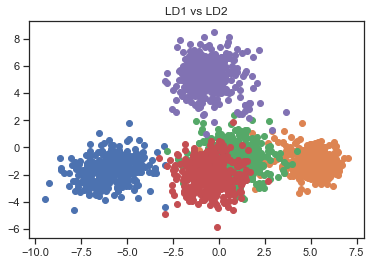

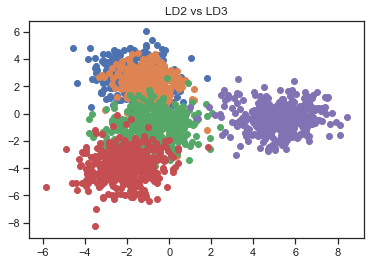

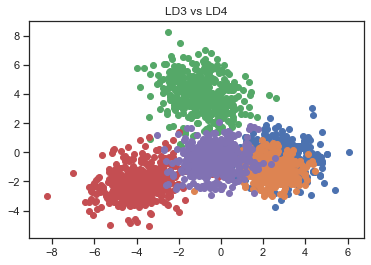

In [193]:
b = Y == 0
c = Y == 1
k = Y == 2
r = Y == 3
g = Y == 4
plt.scatter(X_lda[b,0],X_lda[b,1])
plt.scatter(X_lda[c,0],X_lda[c,1])
plt.scatter(X_lda[k,0],X_lda[k,1])
plt.scatter(X_lda[r,0],X_lda[r,1])
plt.scatter(X_lda[g,0],X_lda[g,1])
plt.title("LD1 vs LD2")
plt.show()

plt.scatter(X_lda[b,1],X_lda[b,2])
plt.scatter(X_lda[c,1],X_lda[c,2])
plt.scatter(X_lda[k,1],X_lda[k,2])
plt.scatter(X_lda[r,1],X_lda[r,2])
plt.scatter(X_lda[g,1],X_lda[g,2])
plt.title("LD2 vs LD3")
plt.show()

plt.scatter(X_lda[b,2],X_lda[b,3])
plt.scatter(X_lda[c,2],X_lda[c,3])
plt.scatter(X_lda[k,2],X_lda[k,3])
plt.scatter(X_lda[r,2],X_lda[r,3])
plt.scatter(X_lda[g,2],X_lda[g,3])
plt.title("LD3 vs LD4")
plt.show()

- Both PCA and LDA are linear transformation techniques that can be used to reduce the number of dimensions in a dataset.
- LDA is supervised algorithm.
- It helps in dimensionality reduction and also does the classification.
- Its reduced the shape of Original Data from (2066,784) to (2066,4).
- It is also clearly visible that LD1 vs LD2 is seperating classes to good extent, followed by LD2 vs LD3 and LD3 vs LD4.


## LDA Compared to PCA

- Both PCA and LDA are linear transformation techniques that can be used to reduce the number of dimensions in a dataset; the former is an unsupervised algorithm,whereas the latter is supervised.
- The goal of LDA is to minimize the variance of each class (means to collapse points as much as possible) and to maximize distance between different classes (taking as far as possible)
- Hence, LDA takes labels into account.
-  On, other hand PCA is blind, has no ideas about labels of data, it makes no distinction.
- It is unsupervised method that just looks at direction of maximum variation of all data points.
- From above scatter plots of PC1 vs PC2 , datapoints are seperated , but not as much as LD1 vs LD2. This is major difference between PCA and LDA.
- LDA seems to be visually better than scatter plots of PCA
- Thus, in my point of view, based on results of scatterplot LDA works fine in both modes, as well in classifier mode as in dimensionality reduction mode.

# Question 3

In [283]:
df = pd.read_csv("DataB.csv")

In [284]:
Y = df.loc[:, 'gnd']
X1 = df.drop(['Unnamed: 0'], axis=1)
X = X1.drop(['gnd'],axis=1)

## Kernel PCA

In [290]:
from sklearn.decomposition import KernelPCA

In [291]:
%%time
kernel_pca = KernelPCA(n_components=2,kernel="rbf")
X_kernel_pca = kernel_pca.fit_transform(X)

Wall time: 625 ms


In [292]:
X_kernel_pca.shape

(2066, 2)

In [293]:
ran = 42
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_kernel_pca, Y, test_size=0.2, random_state = ran)

In [294]:
from sklearn.neighbors import KNeighborsClassifier

neigh_color = neighbors.KNeighborsClassifier(n_neighbors=10,weights = 'distance',metric= 'manhattan')
neigh_color.fit(X_train2, y_train2)
y_pred = neigh_color.predict(X_test2)
accuracy_score(y_test2, y_pred)

0.34541062801932365

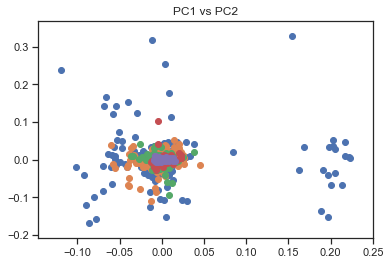

In [256]:
b = Y == 0
c = Y == 1
k = Y == 2
r = Y == 3
g = Y == 4
plt.scatter(X_kernel_pca[b,0],X_kernel_pca[b,1])
plt.scatter(X_kernel_pca[c,0],X_kernel_pca[c,1])
plt.scatter(X_kernel_pca[k,0],X_kernel_pca[k,1])
plt.scatter(X_kernel_pca[r,0],X_kernel_pca[r,1])
plt.scatter(X_kernel_pca[g,0],X_kernel_pca[g,1])
plt.title("PC1 vs PC2")
plt.show()

## Isomap

In [300]:
from sklearn import manifold

In [301]:
%%time
iso = manifold.Isomap(n_components=2)
iso.fit(X)
X_isomap = iso.transform(X)

Wall time: 15.2 s


In [302]:
X_isomap.shape

(2066, 2)

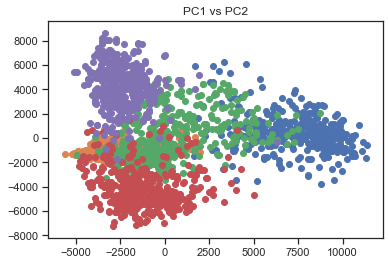

In [303]:
b = Y == 0
c = Y == 1
k = Y == 2
r = Y == 3
g = Y == 4
plt.scatter(X_isomap[b,0],X_isomap[b,1])
plt.scatter(X_isomap[c,0],X_isomap[c,1])
plt.scatter(X_isomap[k,0],X_isomap[k,1])
plt.scatter(X_isomap[r,0],X_isomap[r,1])
plt.scatter(X_isomap[g,0],X_isomap[g,1])
plt.title("PC1 vs PC2")
plt.show()

In [304]:
ran = 42
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_isomap, Y, test_size=0.2, random_state = ran)

In [305]:
from sklearn.neighbors import KNeighborsClassifier

neigh_color = neighbors.KNeighborsClassifier(n_neighbors=10,weights = 'distance',metric= 'manhattan')
neigh_color.fit(X_train2, y_train2)
y_pred = neigh_color.predict(X_test2)
accuracy_score(y_test2, y_pred)

0.8502415458937198

## Locally Linear Embedding

In [261]:
from sklearn.manifold import LocallyLinearEmbedding

In [262]:
%%time
embedding = LocallyLinearEmbedding(n_components=2)
X_lle = embedding.fit_transform(X)
X_lle.shape

Wall time: 7.79 s


(2066, 2)

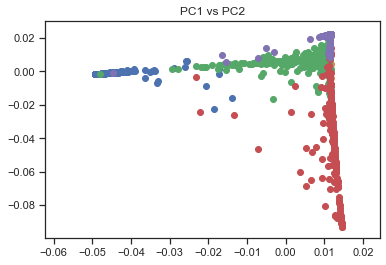

In [263]:
b = Y == 0
c = Y == 1
k = Y == 2
r = Y == 3
g = Y == 4
plt.scatter(X_lle[b,0],X_lle[b,1])
plt.scatter(X_lle[c,0],X_lle[c,1])
plt.scatter(X_lle[k,0],X_lle[k,1])
plt.scatter(X_lle[r,0],X_lle[r,1])
plt.scatter(X_lle[g,0],X_lle[g,1])
plt.title("PC1 vs PC2")
plt.show()

## Laplacian Eigenmap

In [264]:
from sklearn.manifold import SpectralEmbedding

In [265]:
%%time
embedding = SpectralEmbedding(n_components=2)
X_se = embedding.fit_transform(X)
X_se.shape

Wall time: 8.63 s


(2066, 2)

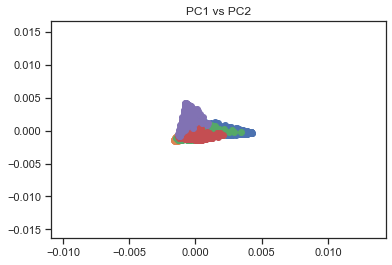

In [266]:
b = Y == 0
c = Y == 1
k = Y == 2
r = Y == 3
g = Y == 4
plt.scatter(X_se[b,0],X_se[b,1])
plt.scatter(X_se[c,0],X_se[c,1])
plt.scatter(X_se[k,0],X_se[k,1])
plt.scatter(X_se[r,0],X_se[r,1])
plt.scatter(X_se[g,0],X_se[g,1])
plt.title("PC1 vs PC2")
plt.show()

## t-SNE

In [295]:
from sklearn.manifold import TSNE

In [296]:
%%time
X_tsne = TSNE(n_components=2).fit_transform(X)
X_tsne.shape

Wall time: 20 s


(2066, 2)

In [297]:
X_tsne

array([[-46.667656, -20.834373],
       [-46.892048, -22.068825],
       [-39.10255 , -11.280189],
       ...,
       [ 19.520864, -41.829304],
       [ 26.379612, -31.966972],
       [ 39.80117 , -31.635519]], dtype=float32)

In [298]:
ran = 42
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_tsne, Y, test_size=0.2, random_state = ran)

In [299]:
from sklearn.neighbors import KNeighborsClassifier

neigh_color = neighbors.KNeighborsClassifier(n_neighbors=10,weights = 'distance',metric= 'manhattan')
neigh_color.fit(X_train2, y_train2)
y_pred = neigh_color.predict(X_test2)
accuracy_score(y_test2, y_pred)


0.961352657004831

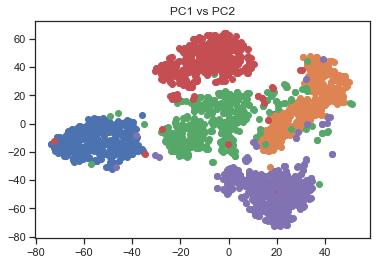

In [269]:
b = Y == 0
c = Y == 1
k = Y == 2
r = Y == 3
g = Y == 4
plt.scatter(X_tsne[b,0],X_tsne[b,1])
plt.scatter(X_tsne[c,0],X_tsne[c,1])
plt.scatter(X_tsne[k,0],X_tsne[k,1])
plt.scatter(X_tsne[r,0],X_tsne[r,1])
plt.scatter(X_tsne[g,0],X_tsne[g,1])
plt.title("PC1 vs PC2")
plt.show()

## Comparing Embeddings

- Commonly used performance evaluation criteria for Non Linear Dimensionality Reduction  algorithms are Graphical method and Quantitative methods.
- In graphical method, we judge the performance of an algorithm by visualization of low dimensional data and can find how successfully the algorithm preserves actual topology of high dimensional data.
- We already performed graphical method for comparision for all algorithms by plotting 2D scatterplots.
- t-SNE outperforms everyother algorithm as it seperates classes by getting maximum variance between classes.
- For Quantitative method , I calculated runtime of every algorithm.
- t-SNE took maximum time ,that is 20.8 seconds while kernel PCA took minimum time , that is 725 ms.
- But, Kernel PCA did not seperate classes to good extent.
- To select between Kernel PCA and t-SNE , I applied kNN after dimensionality reduction with k=10 and manhattan distance.
- Kernel PCA gave only 40% Accuracy which was quite obvious as it didnot seperate classes to good extent, while t-SNE gave accuracy close to 96%.
- Hence, finally to conclude we can use t-SNE specially for this dataset only ,as performance of all the algorithms depends upon which dataset used. kernel PCA might also perform well on other datasets.
- But, for this dataset t-SNE is the winner based on three criteria 1) Graphical method (wins) 2) Runtime(loses) 3) kNN accuracy(wins).